<a href="https://colab.research.google.com/github/Saul-Ochoa/Natural-language-processing/blob/main/Natural%20Language%20Processing%20with%20Disaster%20Tweets%20/Natural_languajes_procesing_Multiclases.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Natural languajes procesing**

In [2]:
pip install datasets

In [3]:
from datasets import load_dataset
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from collections import defaultdict
from nltk.corpus import stopwords
import string
import nltk
import re
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import make_pipeline
from sklearn.metrics import classification_report
import warnings
warnings.filterwarnings('ignore')

In [4]:
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [5]:
from datasets import load_dataset
dataset=load_dataset('ag_news')
dataset

DatasetDict({
    train: Dataset({
        features: ['text', 'label'],
        num_rows: 120000
    })
    test: Dataset({
        features: ['text', 'label'],
        num_rows: 7600
    })
})

In [6]:
# Suponiendo que tienes tu dataset ya cargado
# Crear listas vacías para almacenar los textos y etiquetas
texts = []
labels = []

# Bucle para iterar sobre los datos y extraer 'text' y 'label'
for i in range(0, 120000):
    # Extraer el texto y la etiqueta del dataset
    entry = dataset['train'][i]
    texts.append(entry['text'])
    labels.append(entry['label'])

# Crear un DataFrame a partir de las listas
df_train = pd.DataFrame({
    'text': texts,
    'label': labels
})

df_train.head()

,text,label
0,Wall St. Bears Claw Back Into the Black (Reute...,2
1,Carlyle Looks Toward Commercial Aerospace (Reu...,2
2,Oil and Economy Cloud Stocks' Outlook (Reuters...,2
3,Iraq Halts Oil Exports from Main Southern Pipe...,2
4,"Oil prices soar to all-time record, posing new...",2


In [7]:
df_train['label'].value_counts()

,count
label,
2,30000
3,30000
1,30000
0,30000


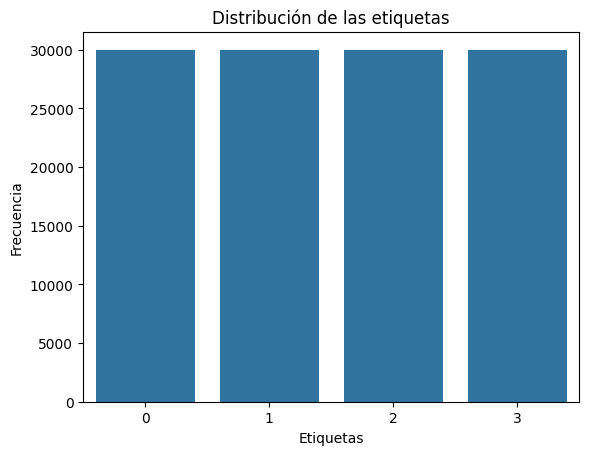

In [8]:
sns.countplot(data=df_train,x='label')
plt.title('Distribución de las etiquetas')
plt.ylabel('Frecuencia')
plt.xlabel('Etiquetas')
plt.show()

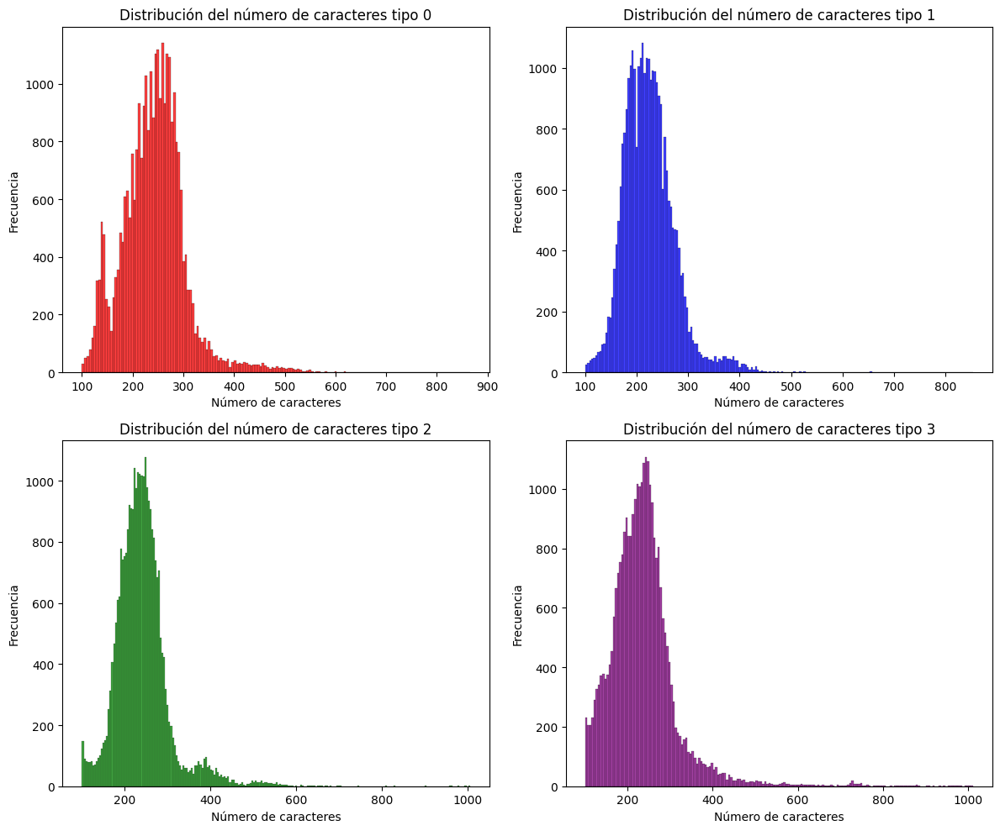

In [9]:
# Crear la figura y un grid de 2x2
fig, axes = plt.subplots(2, 2, figsize=(12, 10))  # 2 filas, 2 columnas

# Definir los colores para cada categoría
colors = ['red', 'blue', 'green', 'purple']

# Número de tipos a graficar (en este caso, 4)
for i in range(4):
    # Obtener la longitud de los textos para la categoría 'i'
    text_len = df_train[df_train['label'] == i]['text'].str.len()

    # Graficar en la posición correspondiente del grid
    ax = axes[i // 2, i % 2]  # Convertir el índice en posición de grid
    sns.histplot(text_len, color=colors[i], ax=ax)

    # Agregar el título y etiquetas
    ax.set_title(f'Distribución del número de caracteres tipo {i}')
    ax.set_xlabel('Número de caracteres')
    ax.set_ylabel('Frecuencia')

# Ajustar el espacio entre los subgráficos
plt.tight_layout()

# Mostrar la figura
plt.show()


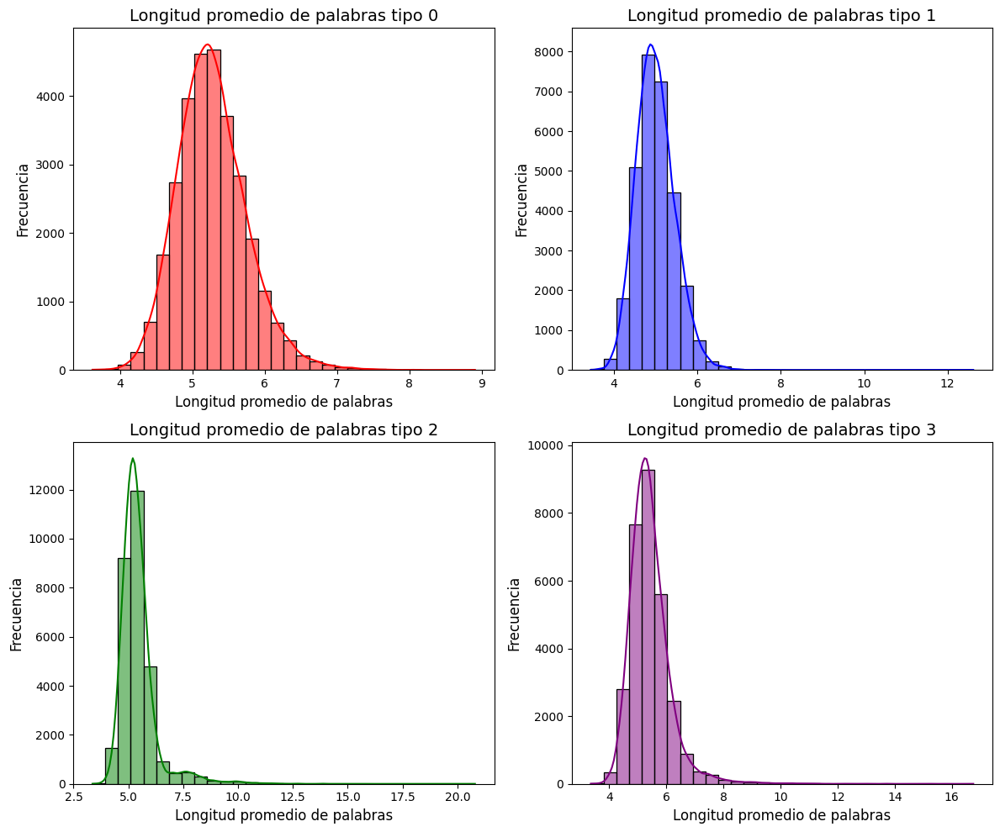

In [10]:
# Crear la figura y un grid de 2x2
fig, axes = plt.subplots(2, 2, figsize=(12, 10))  # 2 filas, 2 columnas

# Definir los colores para cada categoría
colors = ['red', 'blue', 'green', 'purple']

# Número de tipos a graficar (en este caso, 4)
for i in range(4):
    # Obtener la longitud de las palabras en cada texto de la categoría 'i'
    text_len = df_train[df_train['label'] == i]['text'].apply(lambda text: np.mean([len(word) for word in text.split()]))

    # Graficar en la posición correspondiente del grid
    ax = axes[i // 2, i % 2]  # Convertir el índice en posición de grid
    sns.histplot(text_len, color=colors[i], ax=ax, kde=True, bins=30)

    # Agregar el título y etiquetas
    ax.set_title(f'Longitud promedio de palabras tipo {i}', fontsize=14)
    ax.set_xlabel('Longitud promedio de palabras', fontsize=12)
    ax.set_ylabel('Frecuencia', fontsize=12)

# Ajustar el espacio entre los subgráficos
plt.tight_layout()

# Mostrar la figura
plt.show()


In [11]:
df_train.head()

,text,label
0,Wall St. Bears Claw Back Into the Black (Reute...,2
1,Carlyle Looks Toward Commercial Aerospace (Reu...,2
2,Oil and Economy Cloud Stocks' Outlook (Reuters...,2
3,Iraq Halts Oil Exports from Main Southern Pipe...,2
4,"Oil prices soar to all-time record, posing new...",2


In [12]:
#########################################
# Count the stop words
def create_corpus(target):
    corpus=[]

    for x in df_train[df_train['label']==target]['text'].str.split():
        for i in x:
            corpus.append(i)
    return corpus
corpus=create_corpus(0)
print(corpus)

['Venezuelans', 'Vote', 'Early', 'in', 'Referendum', 'on', 'Chavez', 'Rule', '(Reuters)', 'Reuters', '-', 'Venezuelans', 'turned', 'out', 'early\\and', 'in', 'large', 'numbers', 'on', 'Sunday', 'to', 'vote', 'in', 'a', 'historic', 'referendum\\that', 'will', 'either', 'remove', 'left-wing', 'President', 'Hugo', 'Chavez', 'from\\office', 'or', 'give', 'him', 'a', 'new', 'mandate', 'to', 'govern', 'for', 'the', 'next', 'two\\years.', 'S.Koreans', 'Clash', 'with', 'Police', 'on', 'Iraq', 'Troop', 'Dispatch', '(Reuters)', 'Reuters', '-', 'South', 'Korean', 'police', 'used', 'water', 'cannon', 'in\\central', 'Seoul', 'Sunday', 'to', 'disperse', 'at', 'least', '7,000', 'protesters\\urging', 'the', 'government', 'to', 'reverse', 'a', 'controversial', 'decision', 'to\\send', 'more', 'troops', 'to', 'Iraq.', 'Palestinians', 'in', 'Israeli', 'Jails', 'Start', 'Hunger', 'Strike', '(Reuters)', 'Reuters', '-', 'Thousands', 'of', 'Palestinian\\prisoners', 'in', 'Israeli', 'jails', 'began', 'a', 'hun

In [13]:
dic=defaultdict(int)
stop=set(stopwords.words('english'))
for word in corpus:
    if word in stop:
        dic[word]+=1

top=sorted(dic.items(), key=lambda x:x[1],reverse=True)[:10]
top

[('the', 42478),
 ('in', 31207),
 ('to', 30630),
 ('of', 28724),
 ('a', 26785),
 ('and', 17397),
 ('on', 15691),
 ('for', 11225),
 ('that', 6670),
 ('as', 5799)]

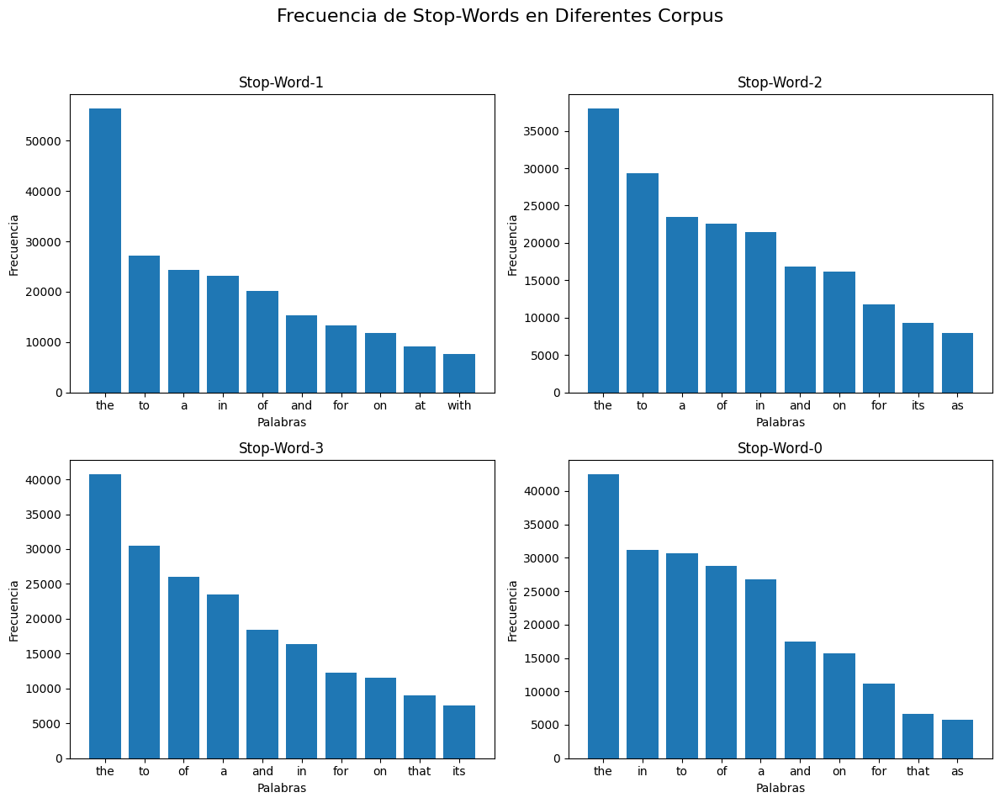

In [14]:
# Crear la figura y los subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('Frecuencia de Stop-Words en Diferentes Corpus', fontsize=16)

# Generar los gráficos para cada corpus
for i in range(0, 4):
    corpus = create_corpus(i)

    # Contador de palabras
    dic = defaultdict(int)
    for word in corpus:
        if word in stop:
            dic[word] += 1

    # Obtener el top 10 de palabras
    top = sorted(dic.items(), key=lambda x: x[1], reverse=True)[:10]

    # Desempaquetar los datos
    if top:
        x, y = zip(*top)
    else:
        x, y = [], []

    # Elegir el subplot correspondiente
    ax = axs[(i-1)//2, (i-1)%2]
    ax.bar(x, y)
    ax.set_title(f'Stop-Word-{i}')
    ax.set_ylabel('Frecuencia')
    ax.set_xlabel('Palabras')

# Mostrar el gráfico
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

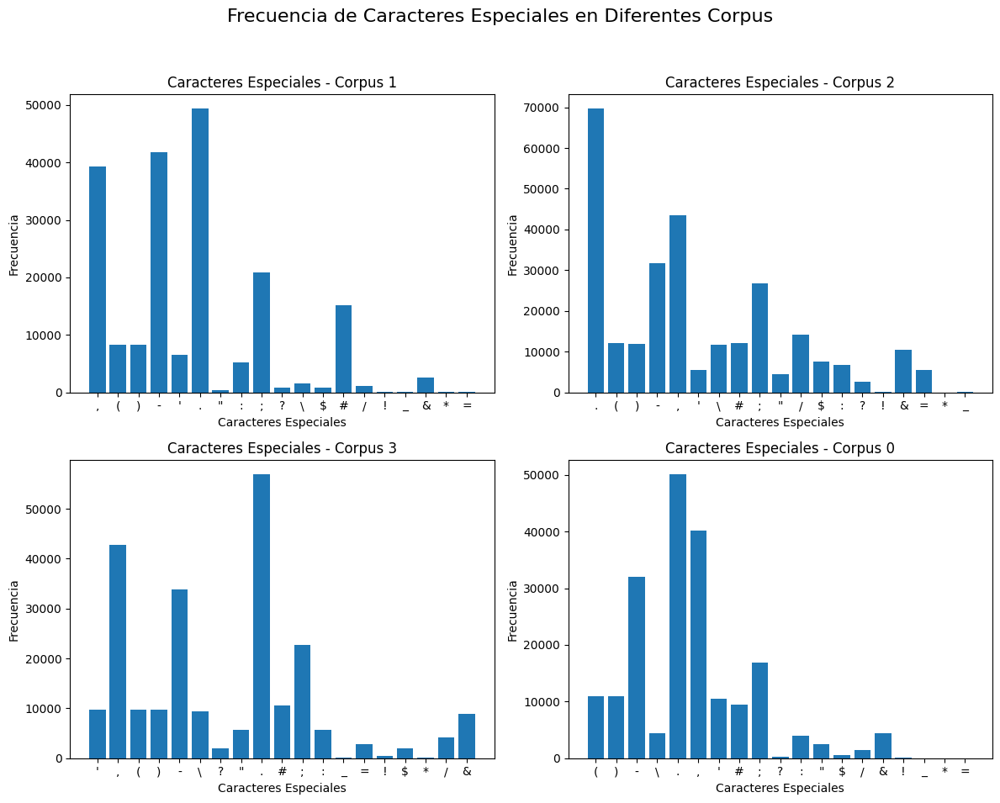

In [15]:
special = string.punctuation
# Crear la figura y los subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('Frecuencia de Caracteres Especiales en Diferentes Corpus', fontsize=16)

# Generar los gráficos para cada corpus
for i in range(0, 4):
    corpus = create_corpus(i)

    # Contador de caracteres especiales
    dic = defaultdict(int)
    for word in corpus:
        for char in word:
            if char in special:
                dic[char] += 1

    # Desempaquetar los datos
    if dic:
        x, y = zip(*dic.items())
    else:
        x, y = [], []

    # Elegir el subplot correspondiente
    ax = axs[(i-1)//2, (i-1)%2]
    ax.bar(x, y)
    ax.set_title(f'Caracteres Especiales - Corpus {i}')
    ax.set_ylabel('Frecuencia')
    ax.set_xlabel('Caracteres Especiales')

# Ajustar el layout y mostrar el gráfico
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

## **Data Cleaning**

In [17]:
import re
import string
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# Descargar recursos necesarios de nltk
nltk.download('stopwords')
nltk.download('wordnet')

# Inicializar lematizador
lemmatizer = WordNetLemmatizer()

# Definir lista de stopwords
stop_words = set(stopwords.words('english'))

# Función de limpieza de texto
def clean_text(text):
    # Convertir a minúsculas
    text = text.lower()

    # Eliminar URLs
    text = re.sub(r'http\S+|www.\S+', '', text)

    # Eliminar signos de puntuación
    text = text.translate(str.maketrans('', '', string.punctuation))

    # Eliminar números
    text = re.sub(r'\d+', '', text)

    # Eliminar caracteres especiales y dígitos
    text = re.sub(r'\W', ' ', text)

    # Eliminar stopwords y aplicar lematización
    text = ' '.join([lemmatizer.lemmatize(word) for word in text.split() if word not in stop_words])

    return text

# Aplicar la función de limpieza a la columna de texto
df_train['text'] = df_train['text'].apply(clean_text)

# Mostrar el DataFrame resultante
df_train.head()

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


,text,label
0,wall st bear claw back black reuters reuters s...,2
1,carlyle look toward commercial aerospace reute...,2
2,oil economy cloud stock outlook reuters reuter...,2
3,iraq halt oil export main southern pipeline re...,2
4,oil price soar alltime record posing new menac...,2


## **GloVe for Vectorization**

In [46]:
!wget http://nlp.stanford.edu/data/glove.6B.zip
!unzip glove.6B.zip

--2024-09-27 16:06:12--  http://nlp.stanford.edu/data/glove.6B.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://nlp.stanford.edu/data/glove.6B.zip [following]
--2024-09-27 16:06:13--  https://nlp.stanford.edu/data/glove.6B.zip
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://downloads.cs.stanford.edu/nlp/data/glove.6B.zip [following]
--2024-09-27 16:06:13--  https://downloads.cs.stanford.edu/nlp/data/glove.6B.zip
Resolving downloads.cs.stanford.edu (downloads.cs.stanford.edu)... 171.64.64.22
Connecting to downloads.cs.stanford.edu (downloads.cs.stanford.edu)|171.64.64.22|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 862182613 (822M) [application/zip]
Saving to: ‘glove.6B.zip.1’

gl

In [18]:
from tqdm import tqdm
def create_corpus(df_train):
    corpus=[]
    for tweet in tqdm(df_train['text']):
        words=[word.lower() for word in word_tokenize(tweet) if((word.isalpha()==1) & (word not in stop))]
        corpus.append(words)
    return corpus

corpus=create_corpus(df_train)

100%|██████████| 120000/120000 [00:34<00:00, 3498.48it/s]


In [19]:
embedding_dict={}
with open('glove.6B.100d.txt', 'r') as f:
    for line in f:
        values=line.split()
        word=values[0]
        vectors=np.asarray(values[1:],'float32')
        embedding_dict[word]=vectors
f.close()


In [20]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

MAX_LEN = 50
tokenizer_obj = Tokenizer()
tokenizer_obj.fit_on_texts(corpus)
sequences = tokenizer_obj.texts_to_sequences(corpus)

tweet_pad = pad_sequences(sequences, maxlen=MAX_LEN, truncating='post', padding='post')


In [21]:
# Number of unique words
word_index=tokenizer_obj.word_index
print('Number of unique words:',len(word_index))

Number of unique words: 83218


In [22]:
num_words=len(word_index)+1
embedding_matrix=np.zeros((num_words,100))

for word,i in tqdm(word_index.items()):
    if i > num_words:
        continue

    emb_vec=embedding_dict.get(word)
    if emb_vec is not None:
        embedding_matrix[i]=emb_vec

100%|██████████| 83218/83218 [00:00<00:00, 203977.85it/s]


## **Modelo**

In [50]:
from keras.models import Sequential
from keras.layers import Embedding,LSTM,Dense,SpatialDropout1D
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from keras.initializers import Constant
from sklearn.model_selection import train_test_split
from keras.optimizers import Adam
from keras.utils import plot_model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, SpatialDropout1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import Constant

# Definir el modelo para clasificación multiclase
#model = Sequential()

# Capa de embedding
#embedding = Embedding(num_words, 100, embeddings_initializer=Constant(embedding_matrix),
#                      input_length=MAX_LEN, trainable=False)
#model.add(embedding)

# Dropout
#model.add(SpatialDropout1D(0.2))

# Capa LSTM
# model.add(LSTM(64, dropout=0.2, recurrent_dropout=0.2))

# Cambiar la capa de salida para multiclase
# model.add(Dense(4, activation='softmax'))  # 4 clases, activación softmax

# Compilar el modelo con categorical_crossentropy
# optimizer = Adam(learning_rate=1e-5)
# model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])

# Imprimir el resumen del modelo
# model.summary()


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding_4 (Embedding)              │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ spatial_dropout1d_4                  │ ?                           │     0 (unbuilt) │
│ (SpatialDropout1D)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_4 (LSTM)                        │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [56]:
train=tweet_pad[:120000]
X_train,X_test,y_train,y_test=train_test_split(train,df_train['label'].values,test_size=0.15)
print('Shape of train',X_train.shape)
print("Shape of Validation ",X_test.shape)


Shape of train (102000, 50)
Shape of Validation  (18000, 50)


In [57]:
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

X_train shape: (102000, 50)
y_train shape: (102000,)
X_test shape: (18000, 50)
y_test shape: (18000,)


In [59]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, SpatialDropout1D
from tensorflow.keras.callbacks import EarlyStopping

# Definición del modelo
model = Sequential()
embedding = Embedding(num_words, 100, embeddings_initializer=Constant(embedding_matrix),
                      input_length=MAX_LEN, trainable=False)
model.add(embedding)
model.add(SpatialDropout1D(0.2))
model.add(LSTM(64, dropout=0.2, recurrent_dropout=0.2))
num_classes=4
model.add(Dense(num_classes, activation='softmax'))  # Cambia aquí para clasificación multiclase

# Compilación del modelo
optimizer = Adam(learning_rate=1e-5)
model.compile(loss='sparse_categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])  # Cambia aquí la función de pérdida

# Configuración de EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Entrenamiento del modelo
history = model.fit(X_train, y_train, batch_size=32, epochs=15, validation_data=(X_test, y_test),
                    verbose=2, callbacks=[early_stopping])


Epoch 1/15


3188/3188 - 170s - 53ms/step - accuracy: 0.3821 - loss: 1.2883 - val_accuracy: 0.4971 - val_loss: 1.0044
Epoch 2/15
3188/3188 - 125s - 39ms/step - accuracy: 0.4816 - loss: 1.0400 - val_accuracy: 0.5036 - val_loss: 0.9470
Epoch 3/15
3188/3188 - 147s - 46ms/step - accuracy: 0.4949 - loss: 1.0023 - val_accuracy: 0.5252 - val_loss: 0.9240
Epoch 4/15
3188/3188 - 140s - 44ms/step - accuracy: 0.5271 - loss: 0.9749 - val_accuracy: 0.6815 - val_loss: 0.8507
Epoch 5/15
3188/3188 - 141s - 44ms/step - accuracy: 0.6364 - loss: 0.8569 - val_accuracy: 0.7687 - val_loss: 0.6209
Epoch 6/15
3188/3188 - 138s - 43ms/step - accuracy: 0.6987 - loss: 0.7544 - val_accuracy: 0.8101 - val_loss: 0.5544
Epoch 7/15
3188/3188 - 145s - 46ms/step - accuracy: 0.7318 - loss: 0.7077 - val_accuracy: 0.8406 - val_loss: 0.5007
Epoch 8/15
3188/3188 - 143s - 45ms/step - accuracy: 0.7568 - loss: 0.6729 - val_accuracy: 0.8546 - val_loss: 0.4696
Epoch 9/15
3188/3188 - 140s - 44ms/step - accuracy: 0.7764 - loss: 0.6414 - val_acc

In [60]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Predicciones
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)  # Obtiene las clases predichas

# Calcula las métricas
accuracy = accuracy_score(y_test, y_pred_classes)
print(f'Exactitud: {accuracy:.4f}')

# Reporte de clasificación
report = classification_report(y_test, y_pred_classes)
print(report)

# Matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred_classes)
print(conf_matrix)

563/563 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step
Exactitud: 0.8801
              precision    recall  f1-score   support

           0       0.91      0.88      0.90      4478
           1       0.94      0.97      0.96      4518
           2       0.84      0.81      0.82      4489
           3       0.83      0.85      0.84      4515

    accuracy                           0.88     18000
   macro avg       0.88      0.88      0.88     18000
weighted avg       0.88      0.88      0.88     18000

[[3960  153  241  124]
 [  44 4401   30   43]
 [ 178   49 3620  642]
 [ 155   83  417 3860]]


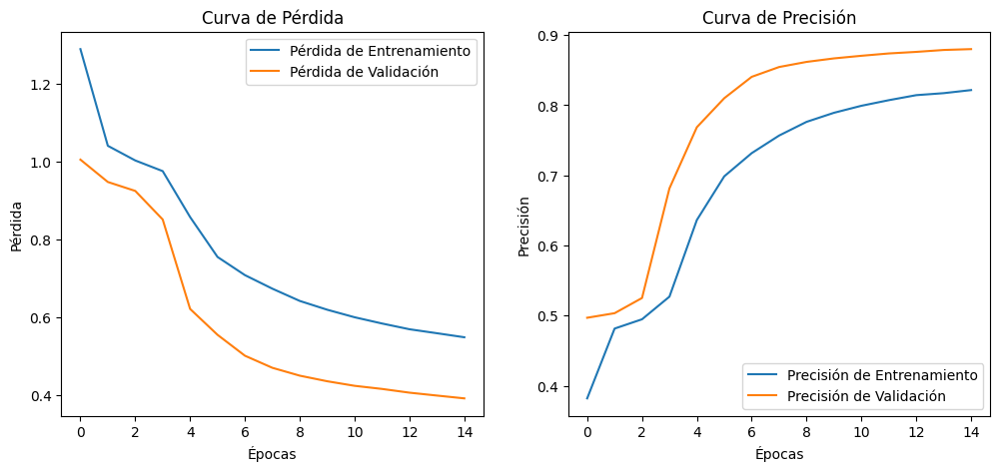

In [61]:
# Gráfico de pérdida
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Pérdida de Entrenamiento')
plt.plot(history.history['val_loss'], label='Pérdida de Validación')
plt.title('Curva de Pérdida')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.legend()

# Gráfico de precisión
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Precisión de Entrenamiento')
plt.plot(history.history['val_accuracy'], label='Precisión de Validación')
plt.title('Curva de Precisión')
plt.xlabel('Épocas')
plt.ylabel('Precisión')
plt.legend()

plt.show()


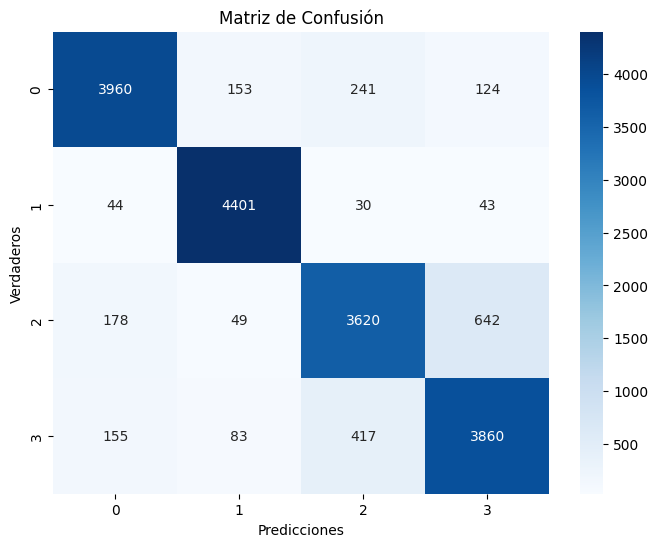

In [62]:
# Matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred_classes)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=[0, 1, 2, 3], yticklabels=[0, 1, 2, 3])
plt.ylabel('Verdaderos')
plt.xlabel('Predicciones')
plt.title('Matriz de Confusión')
plt.show()


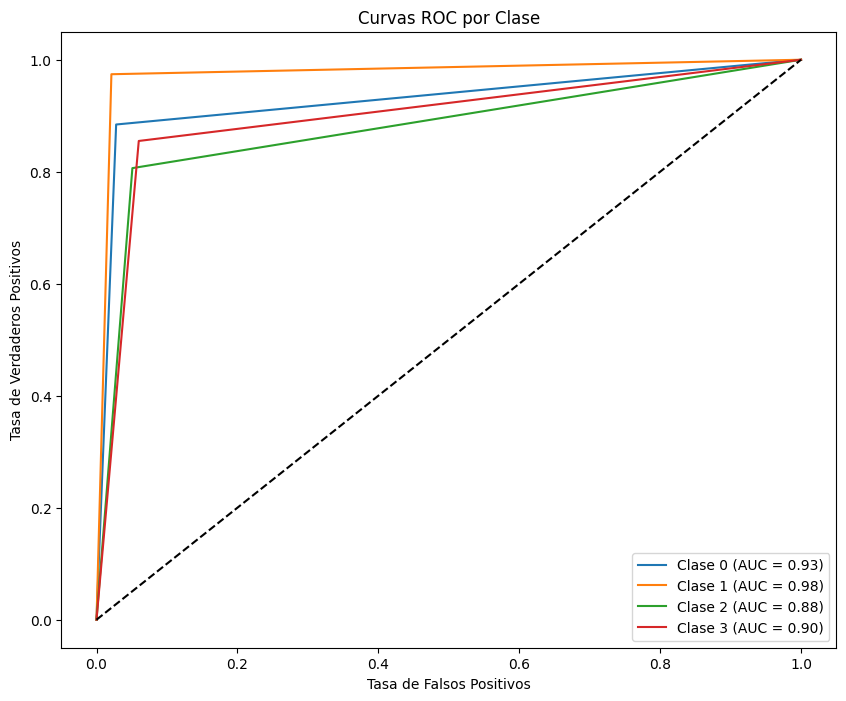

In [64]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binariza las etiquetas
y_test_bin = label_binarize(y_test, classes=[0, 1, 2, 3])
y_pred_bin = label_binarize(y_pred_classes, classes=[0, 1, 2, 3])

# Calcular la curva ROC y AUC para cada clase
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_bin[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Graficar
plt.figure(figsize=(10, 8))
for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], label='Clase {} (AUC = {:.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.title('Curvas ROC por Clase')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.legend()
plt.show()


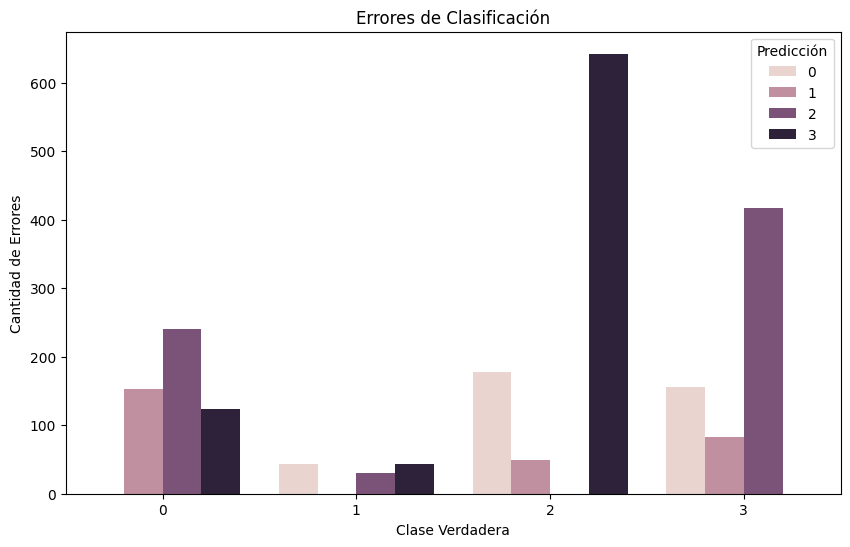

In [65]:
# Comparar las predicciones con las verdaderas
results = pd.DataFrame({'Verdadero': y_test, 'Predicción': y_pred_classes})

# Filtrar los errores
errors = results[results['Verdadero'] != results['Predicción']]

# Gráfico de la distribución de errores
plt.figure(figsize=(10, 6))
sns.countplot(data=errors, x='Verdadero', hue='Predicción')
plt.title('Errores de Clasificación')
plt.xlabel('Clase Verdadera')
plt.ylabel('Cantidad de Errores')
plt.legend(title='Predicción')
plt.show()


## **Conclusiones**

* El modelo muestra un buen rendimiento en general, con una exactitud alta y métricas sólidas en las distintas clases.
Las clases 1 y 0 tienen los mejores resultados, mientras que las clases 2 y 3 tienen un rendimiento ligeramente inferior, aunque siguen siendo aceptables.
La precisión y el recall son bastante equilibrados, lo que sugiere que el modelo no tiene un sesgo significativo hacia ninguna clase en particular.
Estos resultados indican que el modelo es efectivo para la tarea de clasificación de texto que has realizado, aunque siempre es recomendable seguir ajustando y validando el modelo según sea necesario.